In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import plots, params, feats, strats
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strats)

<module 'libs.strats' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strats.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,trade_count,vwap,ask,bid,ret,log_ret,sma_5,sma_pct_5,sma_9,sma_pct_9,sma_21,sma_pct_21,sma_50,sma_pct_50,sma_100,sma_pct_100,sma_200,sma_pct_200,ema_9,ema_21,ema_50,roc_5,roc_10,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,rsi_14,rsi_21,macd_line_6_13_5,macd_signal_6_13_5,macd_diff_6_13_5,macd_line_12_26_9,macd_signal_12_26_9,macd_diff_12_26_9,atr_7,atr_pct_7,atr_14,atr_pct_14,atr_28,atr_pct_28,plus_di_7,minus_di_7,adx_7,plus_di_14,minus_di_14,adx_14,plus_di_28,minus_di_28,adx_28,bb_lband_20_2p0,bb_hband_20_2p0,bb_w_20_2p0,bb_lband_20_3p0,bb_hband_20_3p0,bb_w_20_3p0,bb_lband_50_2p0,bb_hband_50_2p0,bb_w_50_2p0,obv,vol_spike_7,vol_spike_14,vol_spike_28,rolling_max_close_200,rolling_min_close_200,dist_high_200,dist_low_200,obv_diff_7,obv_pct_7,obv_diff_21,obv_pct_21,ret_std_21,ret_std_63,stoch_k_14_3_3,stoch_d_14_3_3,stoch_k_9_3_3,stoch_d_9_3_3,cci_14,cci_20,mfi_14,mfi_20,cmf_14,cmf_20,donch_h_20,donch_l_20,donch_w_20,donch_h_55,donch_l_55,donch_w_55,roll_vwap_20,roll_vwap_50,slope_close_20,slope_close_50,kc_mid_20_20_1.5,kc_l_20_20_1.5,kc_h_20_20_1.5,kc_w_20_20_1.5,kc_mid_20_20_2.0,kc_l_20_20_2.0,kc_h_20_20_2.0,kc_w_20_20_2.0,psar,psar_dir,vwap_ohlc_close_session
2021-09-01 08:00:00,152.340,152.400,152.200,152.310,2052.0,79.0,152.343289,152.3405,152.2795,0.002633,0.002630,151.956,0.002330,151.911111,0.002626,151.874286,0.002869,151.8499,0.003030,151.862701,0.002945,151.874676,0.002866,151.953148,151.894996,151.867887,0.002963,0.003095,0.003161,-0.03,-0.000197,0.06,0.11,0.001313,97.117392,92.108647,88.907688,0.072060,0.027698,0.044362,0.043925,0.012360,0.031565,0.093550,0.000614,0.053679,0.000352,0.031763,0.000209,84.467536,3.401602,28.421520,77.491111,7.239535,19.072892,69.968105,11.638923,14.391505,151.674268,152.077732,0.002657,151.573401,152.178599,0.003985,151.714905,151.984895,0.001778,1.529217e+10,0.613270,1.023843,1.224605,152.31,151.82,0.000000,0.003217,19082.0,125.599677,27680.000000,182.256001,0.000579,0.000339,84.482759,94.827586,84.482759,94.827586,466.666667,657.602451,85.708219,81.744827,0.262026,0.233686,152.400000,151.82,0.003808,152.400,151.80,0.003939,151.889248,151.866828,0.007699,0.001677,151.897444,151.836322,151.958567,0.000805,151.897444,151.815948,151.978941,0.001073,151.820000,1,152.310000
2021-09-01 08:01:00,152.310,152.310,152.310,152.310,1163.0,12.0,152.310000,152.3405,152.2795,0.000000,0.000000,152.048,0.001723,151.961111,0.002296,151.896667,0.002721,151.8593,0.002968,151.866702,0.002919,151.876876,0.002852,152.024518,151.932724,151.885225,0.003029,0.003095,0.003095,0.00,0.000000,0.00,0.00,0.000000,97.117392,92.108647,88.907688,0.106679,0.054025,0.052654,0.071035,0.024095,0.046941,0.080186,0.000526,0.049844,0.000327,0.030628,0.000201,84.467536,3.401602,37.540956,77.491111,7.239535,23.632803,69.968105,11.638923,16.430226,151.624973,152.175027,0.003621,151.487459,152.312541,0.005432,151.672758,152.045842,0.002457,1.529217e+10,0.376288,0.576864,0.696184,152.31,151.82,0.000000,0.003217,17295.0,113.788242,26841.000000,176.705655,0.000579,0.000339,84.482759,89.655172,84.482759,89.655172,235.338654,336.051648,85.801987,86.061612,0.295809,0.278437,152.400000,151.82,0.003808,152.400,151.80,0.003939,151.905092,151.875656,0.013173,0.002735,151.936735,151.878669,151.994802,0.000764,151.936735,151.859314,152.014157,0.001019,151.820000,1,152.310000
2021-09-01 08:02:00,152.300,152.300,152.300,152.300,900.0,32.5,152.300000,152.3305,152.2695,-0.000066,-0.000066,152.138,0.001065,152.011111,0.001900,151.919048,0.002508,151.8687,0.002840,151.870602,0.002827,151.879026,0.002772,152.079614,151.966113,151.901491,0.002963,0.002897,0.003096,0.00,0.000000,0.00,0.00,0.000000,94.266696,90.188784,87.281932,0.122091,0.076714,0.045377,0.090669,0.037410,0.053259,0.070159,0.000461,0.046998,0.000309,0.029892,0.000196,82.747626,5.368519,44.722948,76.313395,8.649316,27.633299,69.132130,12.694655,18.306713,151.598286,152.246714,0.004268,151.436178,152.408822,0.006402,151.645288,152.092112,0.0029

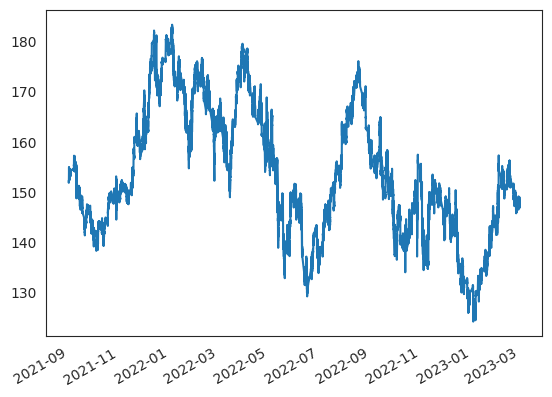

In [3]:
# Read the unscaled indicators dataframe

df_inds = pd.read_csv(params.indunsc_csv, index_col=0, parse_dates=True) # indunsc_test_csv
df_inds = df_inds[(df_inds.index >= '2021-09-01') & (df_inds.index < '2023-03-01')] #########################

df_inds.close.plot()
df_inds

In [7]:
# importlib.reload(params) #####
# importlib.reload(strategies) #####

first_day = df_inds.index.normalize().min()
start_ask = df_inds.loc[df_inds.index.normalize() == first_day, "ask"].iloc[0]
strats.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

sim_results = {}
groups = df_inds.groupby(df_inds.index.normalize())
total_days = df_inds.index.normalize().nunique()

col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strats.generate_actions_alpaca(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = params.col_atr_tick,
        col_adx         = params.col_adx_tick,
        col_vol_spike   = params.col_vol_spike_tick,
        col_rsi         = params.col_rsi_tick,
        col_vwap        = params.col_vwap_tick,
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        vol_thresh      = params.vol_thresh_tick,
        adx_thresh      = params.adx_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        sess_start      = params.sess_premark
    )
    
    sim_results.update(
        strats.simulate_trading(
            day         = day,
            df          = df_actions,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/375 [00:00<?, ?it/s]

Loop finished. Days simulated: 375


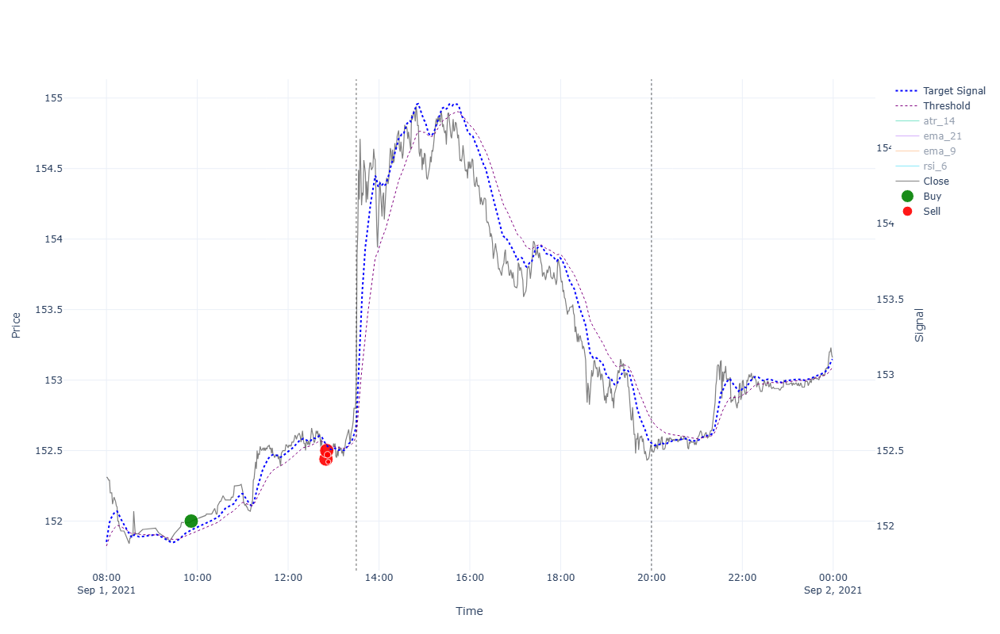


                                                  ******* Performance for 2021-09-01 *******

INTRADAY:
  shares(653); [ask_buy=153.011, fee_buy=0.004, pos_amnt_buy=99918.534]; [bid_sell=152.489, fee_sell=0.018, pos_amnt_sell=99564.215]; leftover=81.466; PNL=-354.318
TRADES:
  Tr[1]: Time(09:52)Ask(152.03)Bid(151.97)Act(Buy)Shrs(624)Pos(624); CashTr(-94869.466)=Cost(-94866.97)-Fee(-2.496); P&L(99959.565)=CashTot(5130.534)+PosAmt(94829.03)
  Tr[2]: Time(12:50)Ask(152.47)Bid(152.41)Act(Sell)Shrs(546)Pos(78); CashTr(83206.032)=Cost(83215.587)-Fee(-9.555); P&L(100224.508)=CashTot(88336.567)+PosAmt(11887.941)
  Tr[3]: Time(12:51)Ask(152.53)Bid(152.47)Act(Sell)Shrs(69)Pos(9); CashTr(10519.188)=Cost(10520.396)-Fee(-1.208); P&L(100227.98)=CashTot(98855.755)+PosAmt(1372.226)
  Tr[4]: Time(12:52)Ask(152.5)Bid(152.44)Act(Sell)Shrs(8)Pos(1); CashTr(1219.376)=Cost(1219.516)-Fee(-0.14); P&L(100227.57)=CashTot(100075.131)+PosAmt(152.44)
  Tr[5]: Time(12:53)Ask(152.451)Bid(152.389)Act(Sell)Shrs(1)Pos

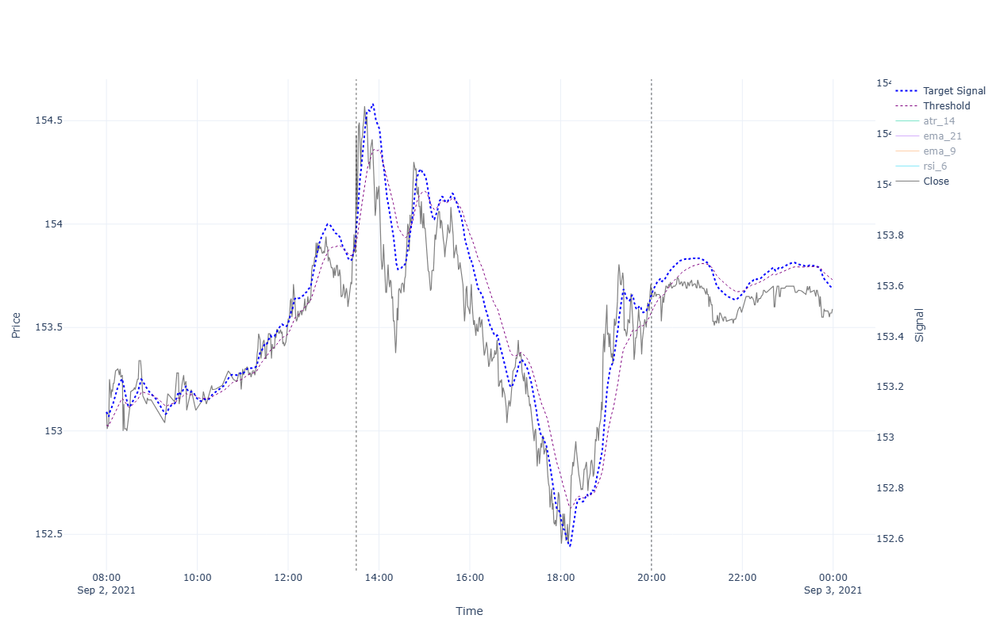


                                                  ******* Performance for 2021-09-02 *******

INTRADAY:
  shares(645); [ask_buy=154.461, fee_buy=0.004, pos_amnt_buy=99629.86]; [bid_sell=153.649, fee_sell=0.018, pos_amnt_sell=99092.493]; leftover=15.821; PNL=-537.367
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=154.461 end=153.649]; leftover=62.008; total_cap=100844.451; PNL=760.811




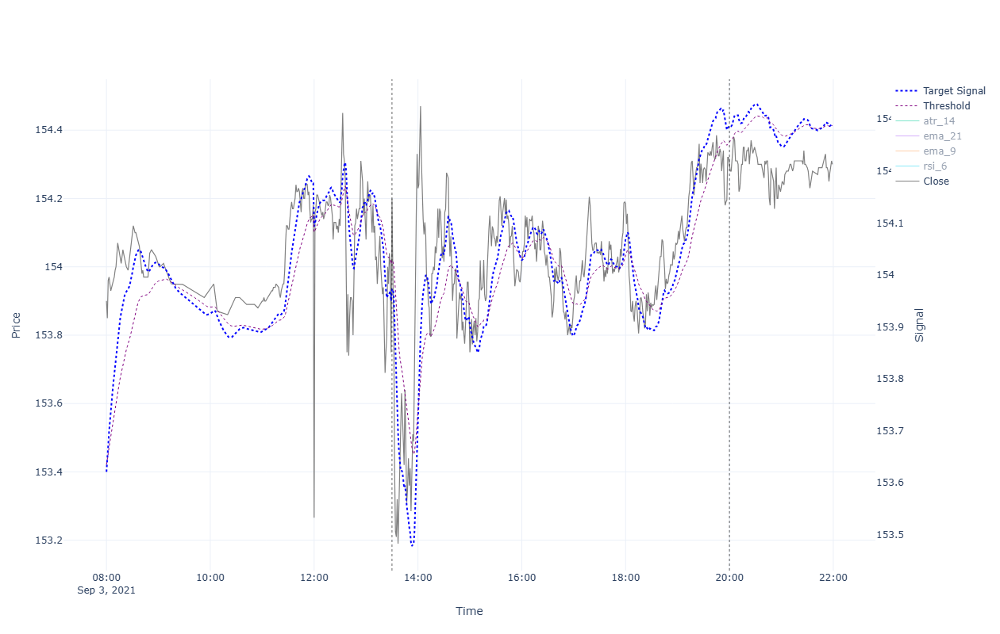


                                                  ******* Performance for 2021-09-03 *******

INTRADAY:
  shares(642); [ask_buy=154.231, fee_buy=0.004, pos_amnt_buy=99018.742]; [bid_sell=154.269, fee_sell=0.018, pos_amnt_sell=99029.5]; leftover=89.573; PNL=10.759
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=154.231 end=154.269]; leftover=62.008; total_cap=101251.03; PNL=406.579




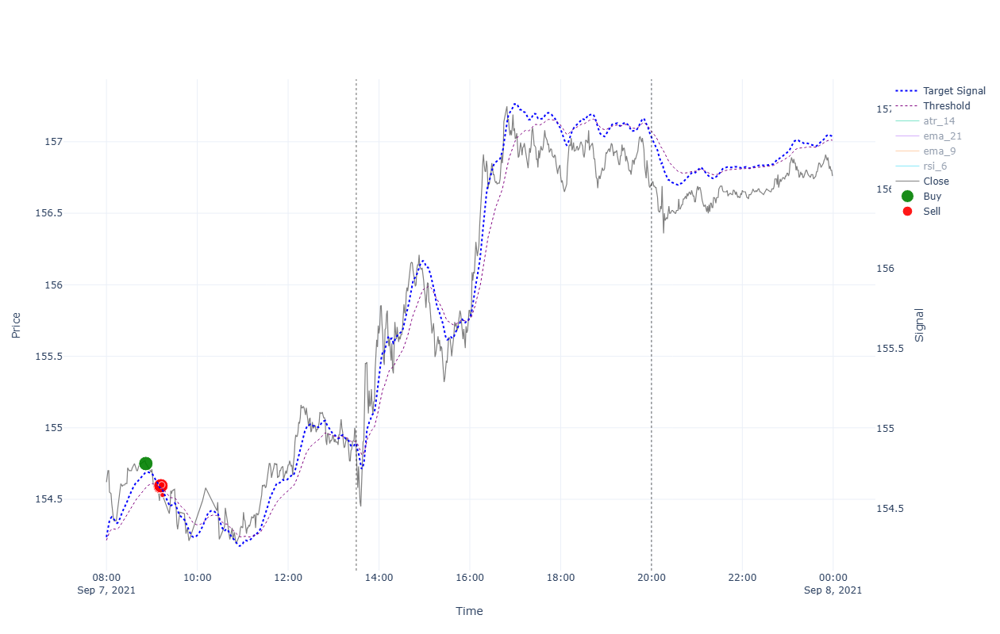


                                                  ******* Performance for 2021-09-07 *******

INTRADAY:
  shares(640); [ask_buy=154.861, fee_buy=0.004, pos_amnt_buy=99113.6]; [bid_sell=156.659, fee_sell=0.018, pos_amnt_sell=100250.306]; leftover=5.473; PNL=1136.706
TRADES:
  Tr[1]: Time(08:52)Ask(154.781)Bid(154.719)Act(Buy)Shrs(614)Pos(614); CashTr(-95037.99)=Cost(-95035.534)-Fee(-2.456); P&L(100186.979)=CashTot(5189.513)+PosAmt(94997.466)
  Tr[2]: Time(09:11)Ask(154.621)Bid(154.559)Act(Sell)Shrs(537)Pos(77); CashTr(82988.813)=Cost(82998.237)-Fee(-9.423); P&L(100079.377)=CashTot(88178.326)+PosAmt(11901.051)
  Tr[3]: Time(09:12)Ask(154.626)Bid(154.564)Act(Sell)Shrs(68)Pos(9); CashTr(10509.166)=Cost(10510.359)-Fee(-1.193); P&L(100078.568)=CashTot(98687.492)+PosAmt(1391.077)
  Tr[4]: Time(09:13)Ask(154.631)Bid(154.569)Act(Sell)Shrs(8)Pos(1); CashTr(1236.412)=Cost(1236.553)-Fee(-0.14); P&L(100078.473)=CashTot(99923.904)+PosAmt(154.569)
  Tr[5]: Time(09:14)Ask(154.561)Bid(154.499)Act(Sell

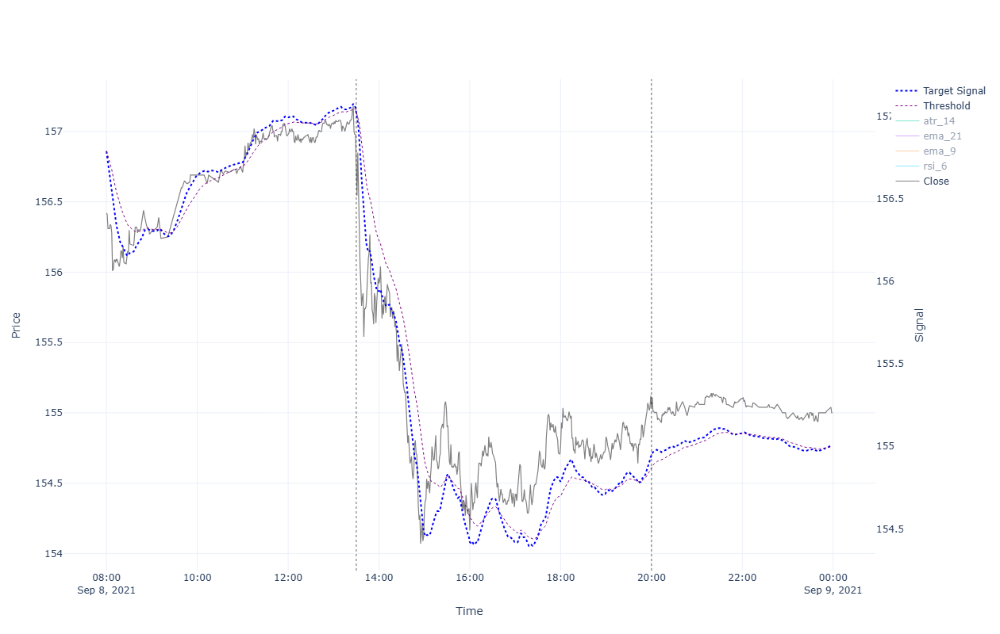


                                                  ******* Performance for 2021-09-08 *******

INTRADAY:
  shares(639); [ask_buy=156.731, fee_buy=0.004, pos_amnt_buy=100153.857]; [bid_sell=155.009, fee_sell=0.018, pos_amnt_sell=99039.531]; leftover=101.923; PNL=-1114.326
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=156.731 end=155.009]; leftover=62.008; total_cap=101736.393; PNL=-1082.178




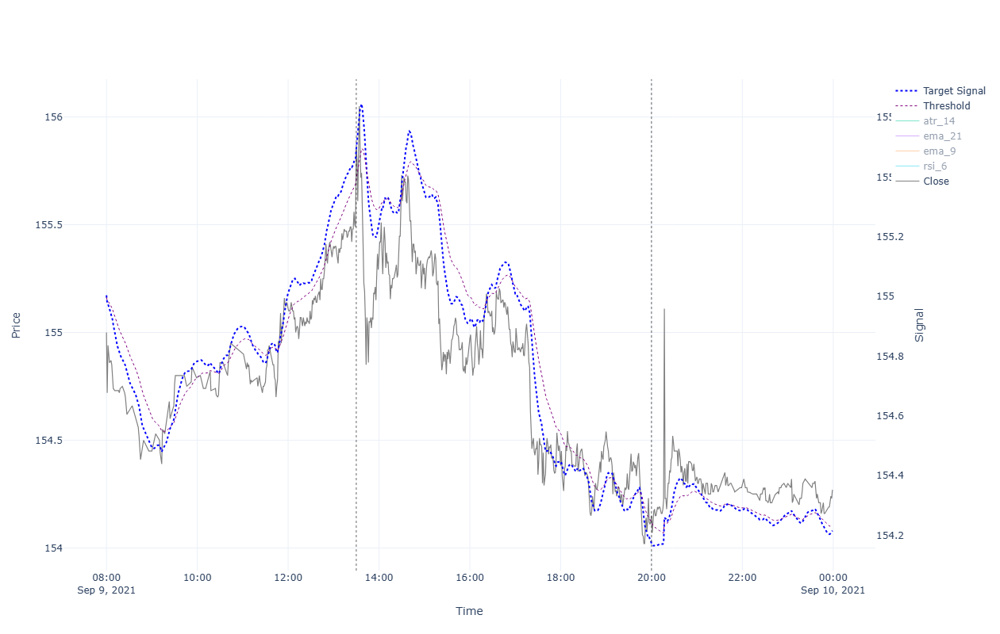


                                                  ******* Performance for 2021-09-09 *******

INTRADAY:
  shares(635); [ask_buy=155.881, fee_buy=0.004, pos_amnt_buy=98987.102]; [bid_sell=154.119, fee_sell=0.018, pos_amnt_sell=97854.555]; leftover=154.352; PNL=-1132.547
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=155.881 end=154.119]; leftover=62.008; total_cap=101152.698; PNL=-583.695




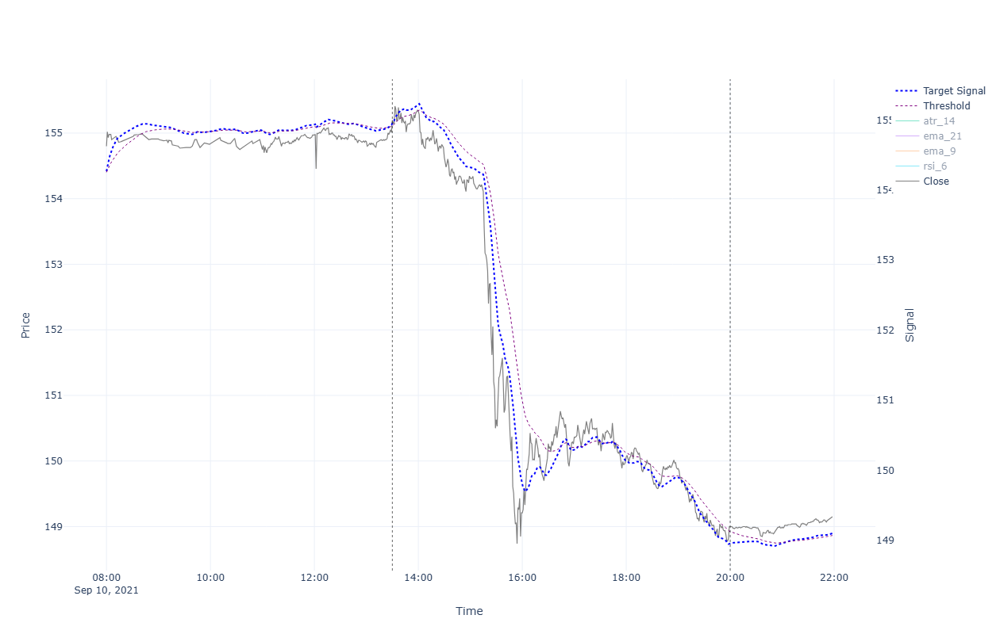


                                                  ******* Performance for 2021-09-10 *******

INTRADAY:
  shares(631); [ask_buy=155.23, fee_buy=0.004, pos_amnt_buy=97952.528]; [bid_sell=148.97, fee_sell=0.017, pos_amnt_sell=93989.204]; leftover=56.379; PNL=-3963.324
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=155.23 end=148.97]; leftover=62.008; total_cap=97775.031; PNL=-3377.667




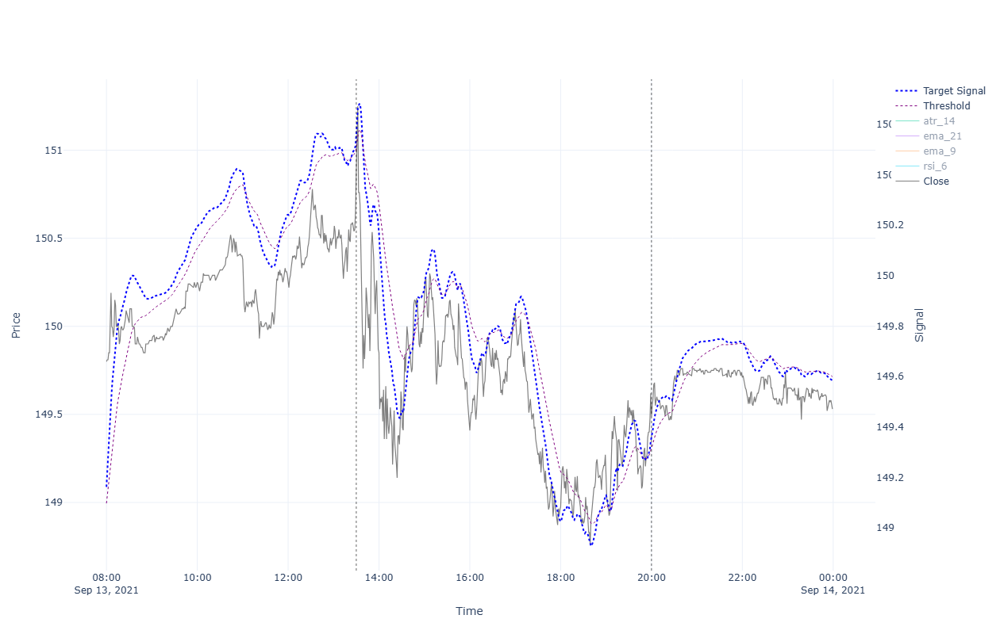


                                                  ******* Performance for 2021-09-13 *******

INTRADAY:
  shares(623); [ask_buy=150.91, fee_buy=0.004, pos_amnt_buy=94019.547]; [bid_sell=149.46, fee_sell=0.017, pos_amnt_sell=93102.782]; leftover=26.036; PNL=-916.764
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=150.91 end=149.46]; leftover=62.008; total_cap=98096.398; PNL=321.367




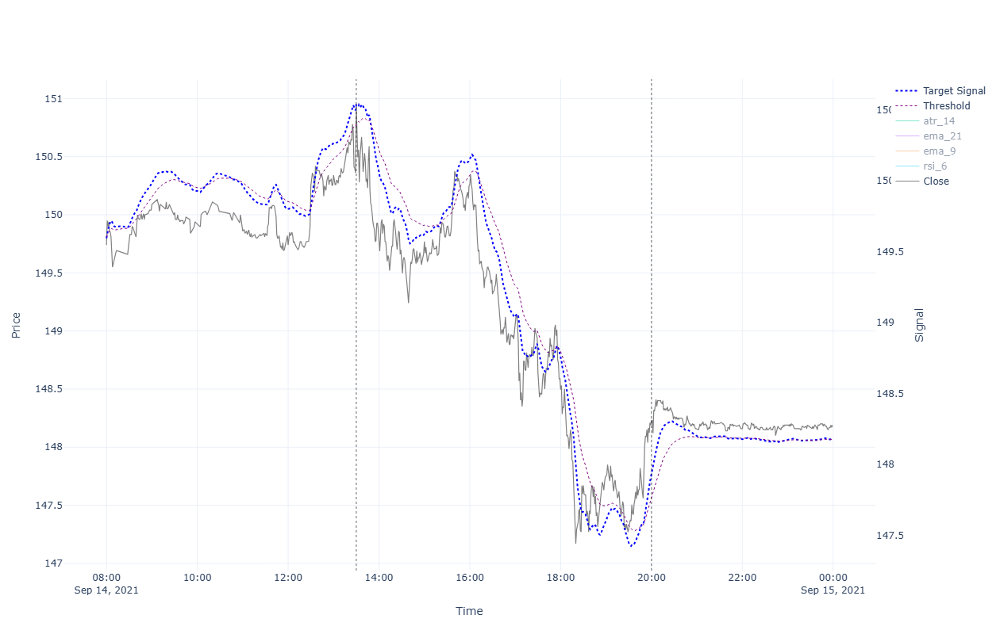


                                                  ******* Performance for 2021-09-14 *******

INTRADAY:
  shares(616); [ask_buy=150.965, fee_buy=0.004, pos_amnt_buy=92996.658]; [bid_sell=148.2, fee_sell=0.017, pos_amnt_sell=91280.726]; leftover=132.161; PNL=-1715.931
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=150.965 end=148.2]; leftover=62.008; total_cap=97270.054; PNL=-826.344




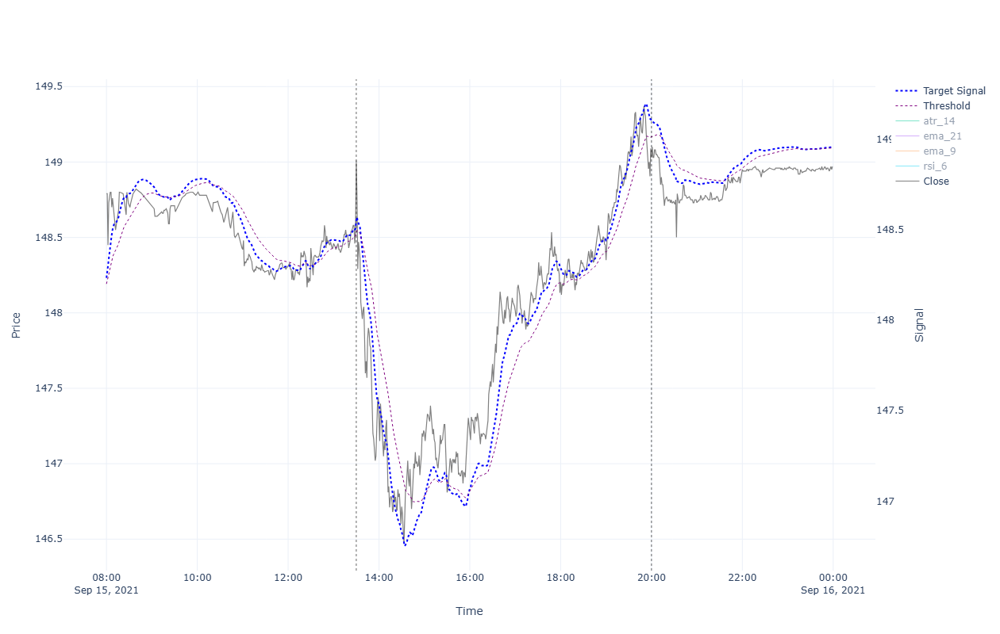


                                                  ******* Performance for 2021-09-15 *******

INTRADAY:
  shares(613); [ask_buy=149.04, fee_buy=0.004, pos_amnt_buy=91363.849]; [bid_sell=149.0, fee_sell=0.017, pos_amnt_sell=91326.443]; leftover=49.038; PNL=-37.406
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=149.04 end=149.0]; leftover=62.008; total_cap=97794.711; PNL=524.657




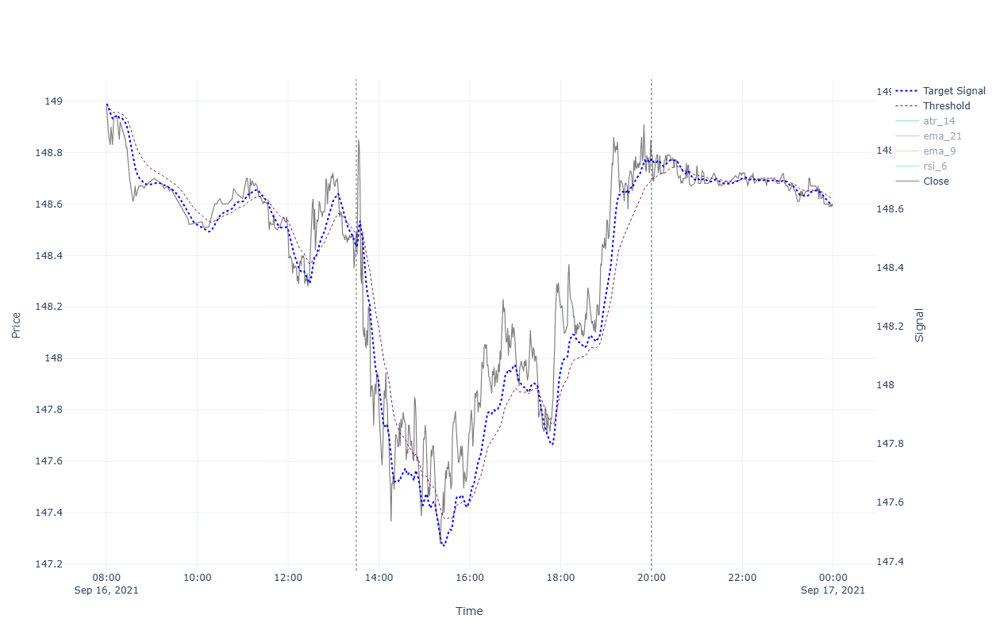


                                                  ******* Performance for 2021-09-16 *******

INTRADAY:
  shares(615); [ask_buy=148.52, fee_buy=0.004, pos_amnt_buy=91342.075]; [bid_sell=148.76, fee_sell=0.017, pos_amnt_sell=91476.812]; leftover=33.406; PNL=134.737
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=148.52 end=148.76]; leftover=62.008; total_cap=97637.275; PNL=-157.436




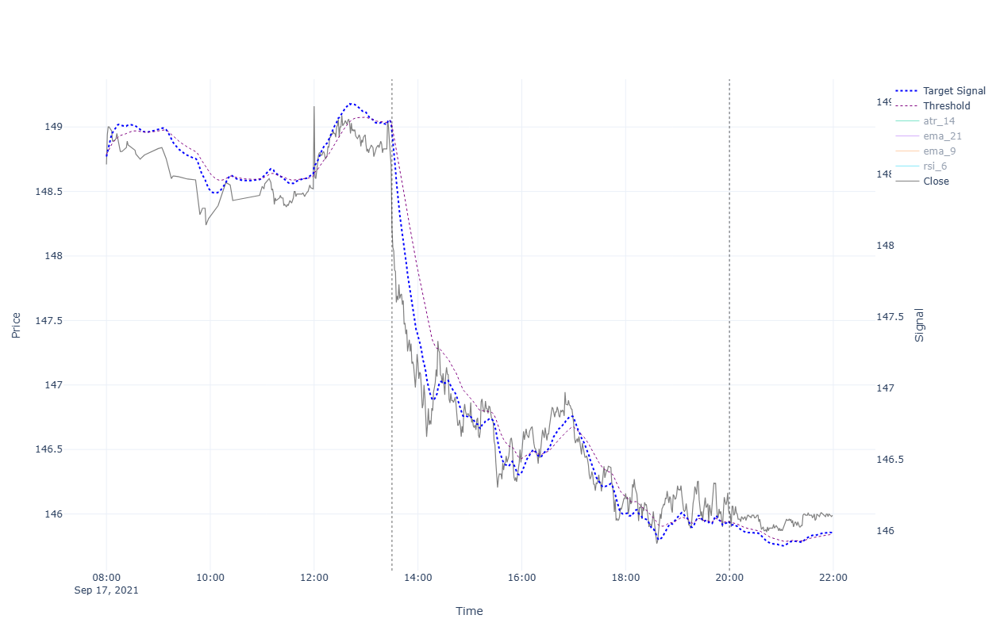


                                                  ******* Performance for 2021-09-17 *******

INTRADAY:
  shares(617); [ask_buy=148.24, fee_buy=0.004, pos_amnt_buy=91466.301]; [bid_sell=145.971, fee_sell=0.017, pos_amnt_sell=90053.278]; leftover=43.917; PNL=-1413.024
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=148.24 end=145.971]; leftover=62.008; total_cap=95807.47; PNL=-1829.804




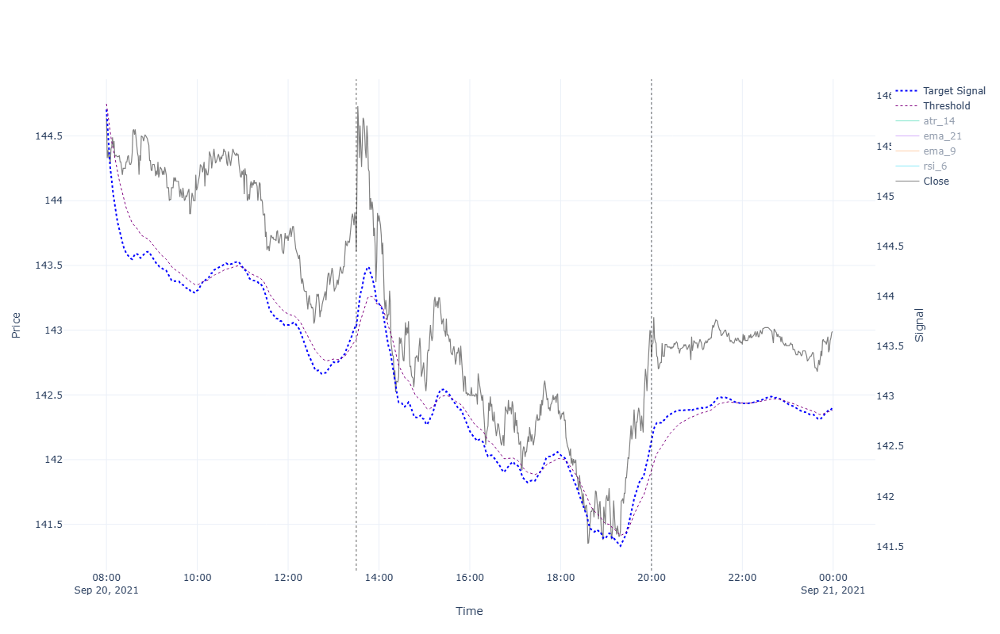


                                                  ******* Performance for 2021-09-20 *******

INTRADAY:
  shares(627); [ask_buy=143.639, fee_buy=0.004, pos_amnt_buy=90063.973]; [bid_sell=142.761, fee_sell=0.017, pos_amnt_sell=89500.564]; leftover=33.222; PNL=-563.409
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=143.639 end=142.761]; leftover=62.008; total_cap=93702.152; PNL=-2105.318




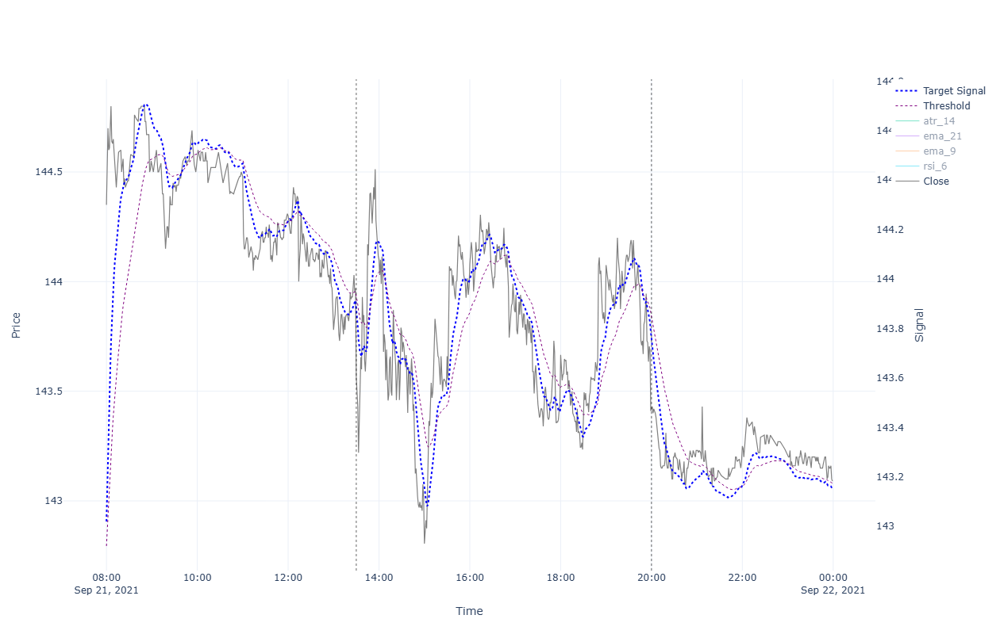


                                                  ******* Performance for 2021-09-21 *******

INTRADAY:
  shares(623); [ask_buy=143.592, fee_buy=0.004, pos_amnt_buy=89460.495]; [bid_sell=143.391, fee_sell=0.017, pos_amnt_sell=89322.007]; leftover=73.291; PNL=-138.488
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=143.592 end=143.391]; leftover=62.008; total_cap=94115.357; PNL=413.205




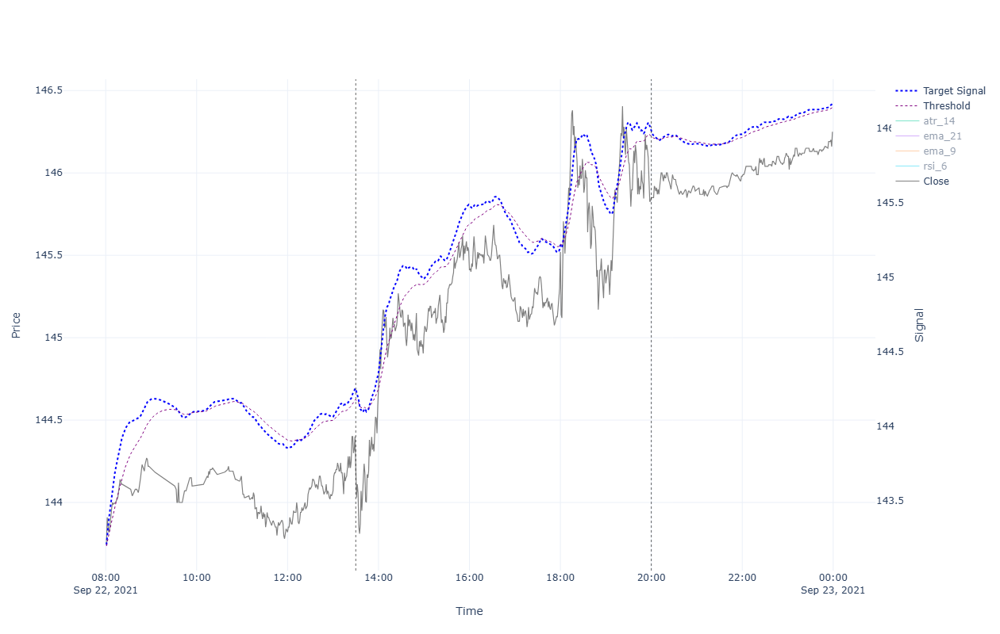


                                                  ******* Performance for 2021-09-22 *******

INTRADAY:
  shares(619); [ask_buy=144.244, fee_buy=0.004, pos_amnt_buy=89289.388]; [bid_sell=145.821, fee_sell=0.017, pos_amnt_sell=90252.337]; leftover=105.91; PNL=962.948
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=144.244 end=145.821]; leftover=62.008; total_cap=95709.072; PNL=1593.716




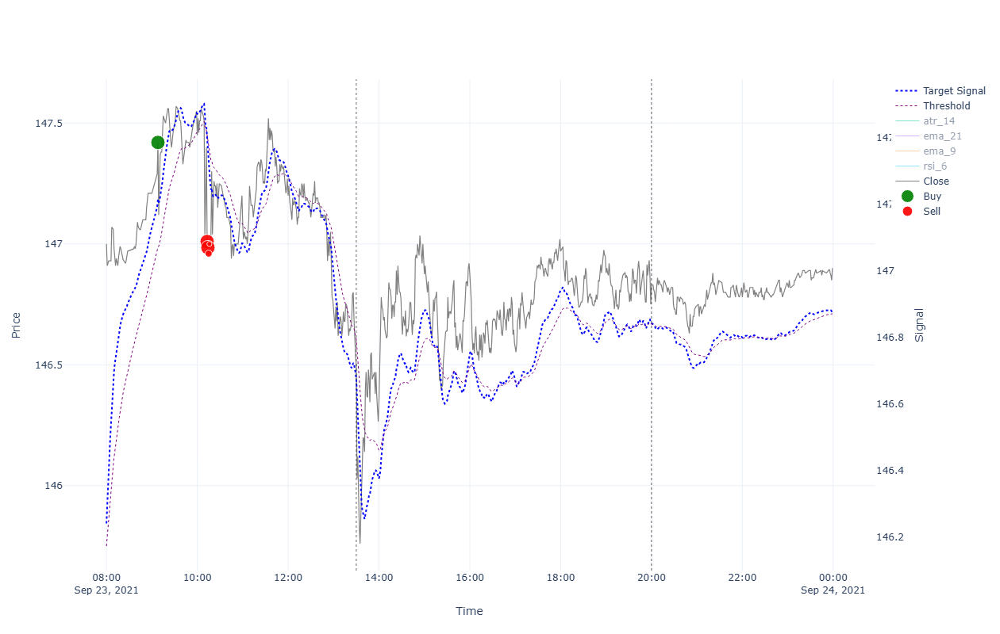


                                                  ******* Performance for 2021-09-23 *******

INTRADAY:
  shares(616); [ask_buy=146.529, fee_buy=0.004, pos_amnt_buy=90264.513]; [bid_sell=146.801, fee_sell=0.017, pos_amnt_sell=90418.469]; leftover=93.733; PNL=153.956
TRADES:
  Tr[1]: Time(09:08)Ask(147.45)Bid(147.391)Act(Buy)Shrs(644)Pos(644); CashTr(-94960.054)=Cost(-94957.478)-Fee(-2.576); P&L(100037.813)=CashTot(5118.331)+PosAmt(94919.482)
  Tr[2]: Time(10:13)Ask(147.039)Bid(146.981)Act(Sell)Shrs(563)Pos(81); CashTr(82740.296)=Cost(82750.078)-Fee(-9.782); P&L(99764.056)=CashTot(87858.627)+PosAmt(11905.429)
  Tr[3]: Time(10:14)Ask(147.014)Bid(146.956)Act(Sell)Shrs(71)Pos(10); CashTr(10432.614)=Cost(10433.848)-Fee(-1.234); P&L(99760.797)=CashTot(98291.241)+PosAmt(1469.556)
  Tr[4]: Time(10:15)Ask(146.989)Bid(146.931)Act(Sell)Shrs(9)Pos(1); CashTr(1322.219)=Cost(1322.375)-Fee(-0.156); P&L(99760.391)=CashTot(99613.46)+PosAmt(146.931)
  Tr[5]: Time(10:16)Ask(147.029)Bid(146.971)Act(Sell)

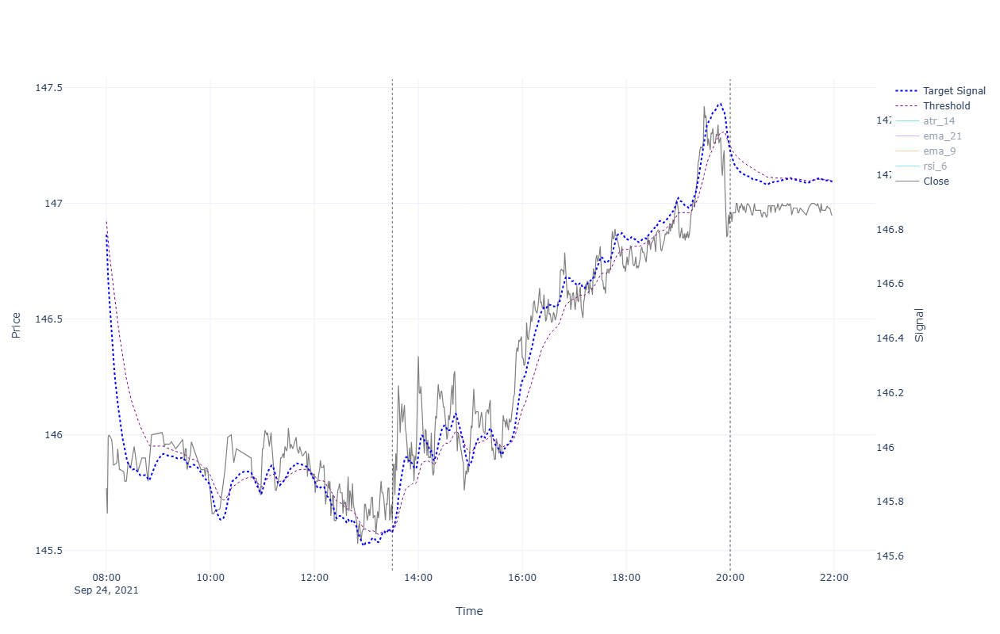


                                                  ******* Performance for 2021-09-24 *******

INTRADAY:
  shares(621); [ask_buy=145.66, fee_buy=0.004, pos_amnt_buy=90457.406]; [bid_sell=146.931, fee_sell=0.017, pos_amnt_sell=91233.114]; leftover=54.797; PNL=775.707
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=145.66 end=146.931]; leftover=62.008; total_cap=96437.084; PNL=85.278




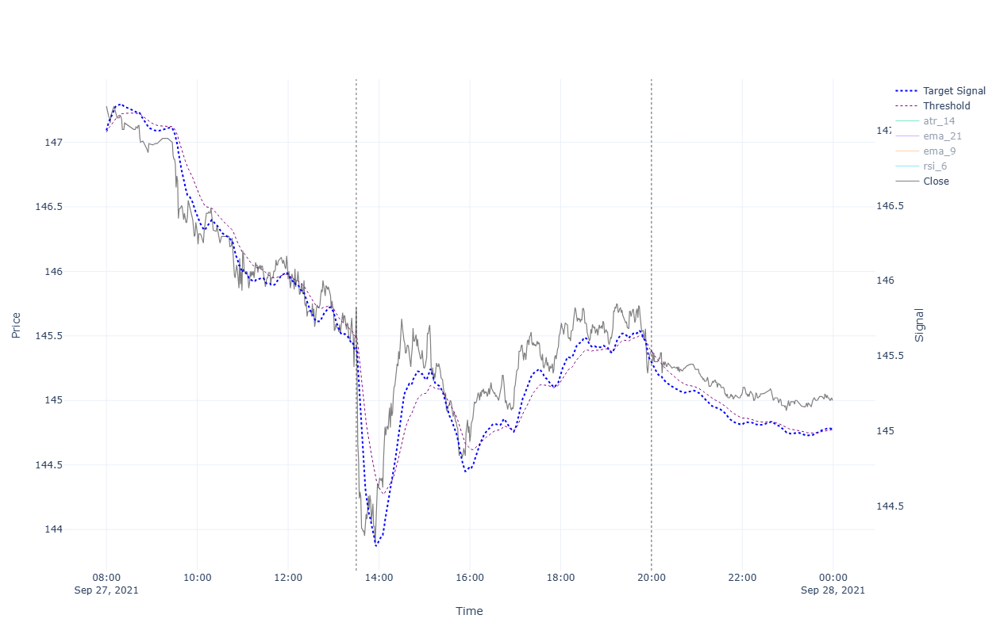


                                                  ******* Performance for 2021-09-27 *******

INTRADAY:
  shares(626); [ask_buy=145.749, fee_buy=0.004, pos_amnt_buy=91241.441]; [bid_sell=145.361, fee_sell=0.017, pos_amnt_sell=90985.07]; leftover=46.469; PNL=-256.371
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=145.749 end=145.361]; leftover=62.008; total_cap=95407.385; PNL=-1029.7




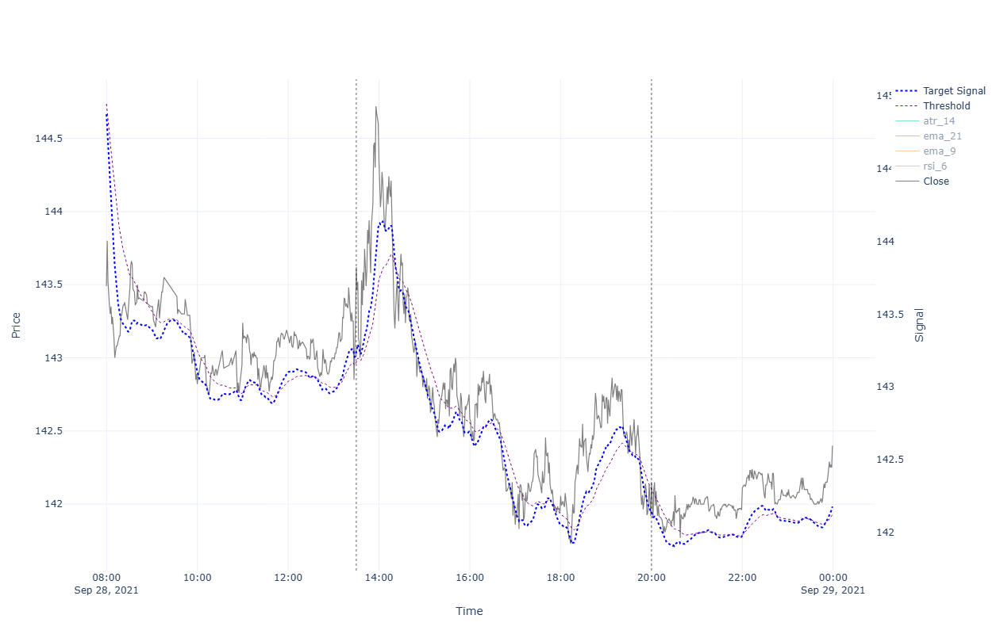


                                                  ******* Performance for 2021-09-28 *******

INTRADAY:
  shares(633); [ask_buy=143.649, fee_buy=0.004, pos_amnt_buy=90932.159]; [bid_sell=142.122, fee_sell=0.017, pos_amnt_sell=89952.045]; leftover=99.38; PNL=-980.114
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=143.649 end=142.122]; leftover=62.008; total_cap=93282.453; PNL=-2124.932




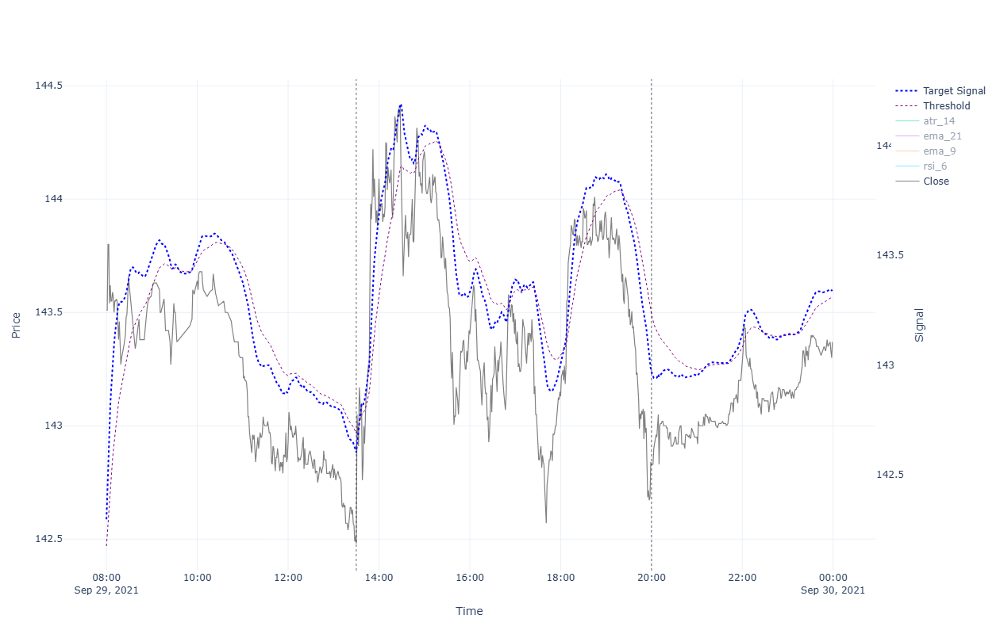


                                                  ******* Performance for 2021-09-29 *******

INTRADAY:
  shares(631); [ask_buy=142.508, fee_buy=0.004, pos_amnt_buy=89925.387]; [bid_sell=142.801, fee_sell=0.017, pos_amnt_sell=90096.78]; leftover=126.038; PNL=171.393
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=142.508 end=142.801]; leftover=62.008; total_cap=93728.391; PNL=445.939




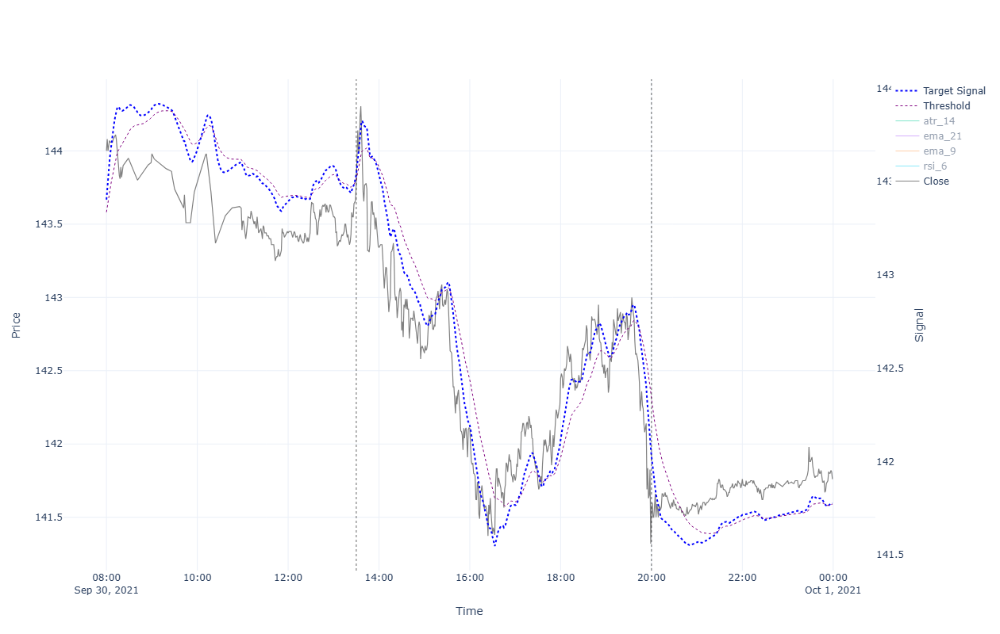


                                                  ******* Performance for 2021-09-30 *******

INTRADAY:
  shares(627); [ask_buy=143.809, fee_buy=0.004, pos_amnt_buy=90170.626]; [bid_sell=141.532, fee_sell=0.017, pos_amnt_sell=88729.56]; leftover=52.192; PNL=-1441.065
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(656); [start=143.809 end=141.532]; leftover=62.008; total_cap=92895.487; PNL=-832.904




NameError: name 'sess_start' is not defined

In [9]:
# importlib.reload(params) ######
# importlib.reload(strategies) ######
# importlib.reload(plots) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "="*160 + "\n")

# final visualizations and monthly aggregations
strats.aggregate_performance(df = df_inds,
                                 sim_results = sim_results,
                                 sess_start = sess_start)


In [ ]:
# # propose adjusted parameters ranges for next optuna run
# from libs import opts
# new_ranges = opts.propose_ranges_from_top(
#     csv_path="optuna_results/AAPL_21.1404_predicted.csv",
#     top_n=25,
#     spread=1.0,
#     agg="median",
#     cat_top_k=3,
# )

# new_ranges